# 0. Setup

In [ ]:
%pip install ultralytics opencv-python numpy pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.172 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.2/112.6 GB disk)


# 1. Object Detection

Object detection is a task that involves identifying the location and class of objects in an image or video stream.

The output of an object detector is a set of bounding boxes that enclose the objects in the image, along with class labels and confidence scores for each box.

![banner](https://github.com/ultralytics/docs/releases/download/0/object-detection-examples.avif)

### Models

The model we are going to use is **YOLO11**. There are different versions, and key insights can be seen from the table below:

| Model   | size (pixels) | mAP<sup>val</sup> 50-95 | Speed CPU ONNX (ms) | Speed T4 TensorRT10 (ms) | params (M) |
|---------|--------------|---------------------|-----------------|---------------------|------------|
| YOLO11n | 640          | 39.5                | 56.1 ± 0.8      | 1.5 ± 0.0           | 2.6        |
| YOLO11s | 640          | 47.0                | 90.0 ± 1.2      | 2.5 ± 0.0           | 9.4        |
| YOLO11m | 640          | 51.5                | 183.2 ± 2.0     | 4.7 ± 0.1           | 20.1       |
| YOLO11l | 640          | 53.4                | 238.6 ± 1.4     | 6.2 ± 0.1           | 25.3       |
| YOLO11x | 640          | 54.7                | 462.8 ± 6.7     | 11.3 ± 0.2          | 56.9       |

##### Key Insights:

1. **YOLO11n** has only **2.6M parameters**, making it highly efficient for low-resource environments.
2. **YOLO11x**, with **56.9M parameters**, achieves the highest accuracy but is computationally expensive.

## 1.1 Inference

Use a trained **YOLO11n** model to run predictions on images.  
All Ultralytics `predict()` calls will return a list of **Results** objects.

#### Results Object Attributes

| Attribute  | Type      | Description |
|------------|----------|-------------|
| `boxes`    | `Boxes` (optional) | Contains the detection bounding boxes. |
| `probs`    | `Probs` (optional) | Contains probabilities of each class for classification tasks. |
| `names`    | `dict`   | A dictionary mapping class indices to class names. |

#### Results Object Methods

| Method      | Return Type      | Description |
|------------|-----------------|-------------|
| `plot()`   | `np.ndarray`     | Plots detection results on an input RGB image and returns the annotated image. |
| `show()`   | `None`           | Displays the image with annotated inference results. |
| `save()`   | `str`            | Saves the annotated inference results image to a file and returns the filename. |



0: 640x480 4 persons, 1 bus, 47.1ms
Speed: 43.0ms preprocess, 47.1ms inference, 435.8ms postprocess per image at shape (1, 3, 640, 480)


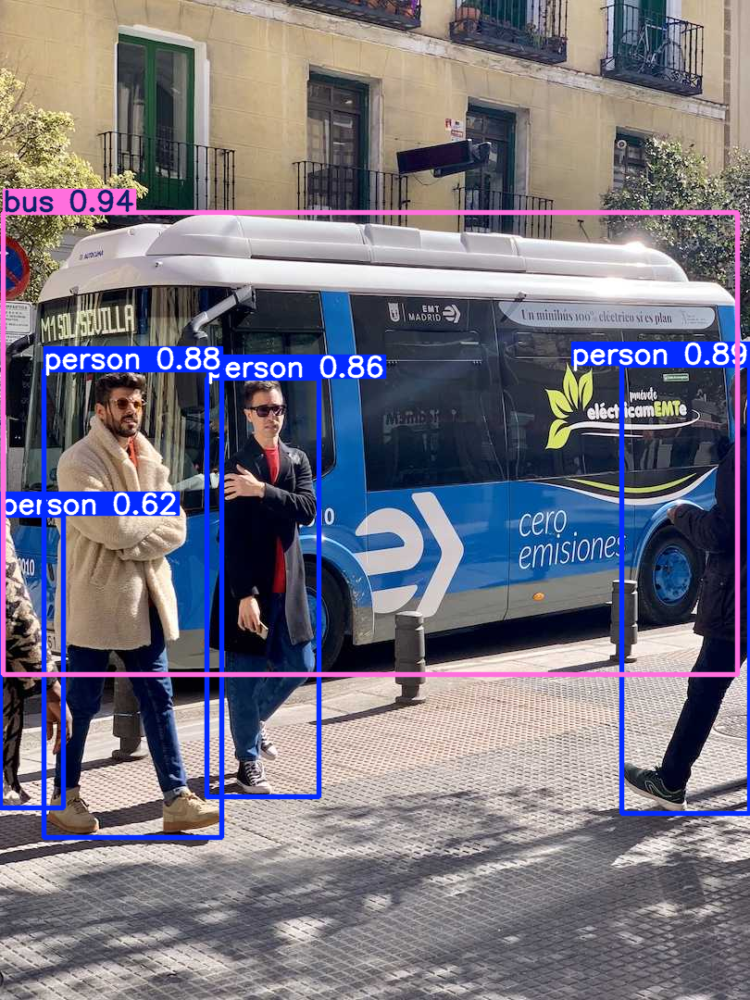

In [ ]:
from ultralytics import YOLO
from PIL import Image
import IPython.display as display

# Load a pretrained YOLO11n model
model = YOLO("yolo11n.pt")

# Run inference on 'bus.jpg'
results = model(["https://ultralytics.com/images/bus.jpg"])

# Process results list
for result in results:

    # Plot results image
    im_bgr = result.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # Convert BGR to RGB for PIL

    # Display results inline
    display.display(im_rgb)

    # Save results to disk
    result.save(filename="result.jpg")

#### Boxes Class

The **Boxes** object can be used to **index, manipulate, and convert** bounding boxes to different formats.

| Name      | Type                    | Description |
|-----------|-------------------------|-------------|
| `xyxy`    | Property (`torch.Tensor`) | Returns the boxes in `xyxy` format. |
| `conf`    | Property (`torch.Tensor`) | Returns the confidence values of the boxes. |
| `cls`     | Property (`torch.Tensor`) | Returns the class values of the boxes. |
| `id`      | Property (`torch.Tensor`) | Returns the track IDs of the boxes (if available). |
| `xywh`    | Property (`torch.Tensor`) | Returns the boxes in `xywh` format. |
| `xyxyn`   | Property (`torch.Tensor`) | Returns the boxes in `xyxy` format, normalized by original image size. |
| `xywhn`   | Property (`torch.Tensor`) | Returns the boxes in `xywh` format, normalized by original image size. |


In [ ]:
print("Bounding Boxes (xyxy format):", results[0].boxes.xyxy, '\n')
print("Confidence Scores:", results[0].boxes.conf, '\n')
print("Class Labels:", results[0].boxes.cls, '\n')

Bounding Boxes (xyxy format): tensor([[3.8328e+00, 2.2936e+02, 7.9619e+02, 7.2841e+02],
        [6.7102e+02, 3.9483e+02, 8.0981e+02, 8.7871e+02],
        [4.7405e+01, 3.9957e+02, 2.3930e+02, 9.0419e+02],
        [2.2306e+02, 4.0869e+02, 3.4447e+02, 8.6044e+02],
        [2.1739e-02, 5.5607e+02, 6.8886e+01, 8.7236e+02]], device='cuda:0') 

Confidence Scores: tensor([0.9402, 0.8882, 0.8783, 0.8558, 0.6219], device='cuda:0') 

Class Labels: tensor([5., 0., 0., 0., 0.], device='cuda:0') 



### Task
Transform the class labels back to their corresponding names.

```ascii
Class Labels: tensor([5., 0., 0., 0., 0.])
Class Names: ['bus', 'person', 'person', 'person', 'person']
```

In [ ]:
# Answer Here!
[results[0].names[int(id)] for id in results[0].boxes.cls]

['bus', 'person', 'person', 'person', 'person']

### Supported Data Sources for YOLO Inference

The YOLO model supports various input sources, including images, videos, directories, and streaming protocols.

#### Source Types:

| Source        | Example                                      | Type         | Notes |
|--------------|----------------------------------------------|-------------|-------|
| **Image**    | `'image.jpg'`                                | `str` or `Path` | Single image file. |
| **URL**      | `'https://ultralytics.com/images/bus.jpg'`   | `str`       | URL to an image. |
| **OpenCV**   | `cv2.imread('image.jpg')`                   | `np.ndarray` | HWC format with BGR channels `uint8 (0-255)`. |
| **Video**  | `'video.mp4'`                               | `str` or `Path` | Video file in formats like MP4, AVI, etc. |
| **YouTube** | `'https://youtu.be/LNwODJXcvt4'`          | `str`       | URL to a YouTube video. |
| **Webcam** | `0`                                        | `int`       | Index of the connected camera device to run inference on. |


### Video / Webcam

- Set `video_path = 0` for webcam.

- Set `video_path = "your_video.mp4"` for video file.

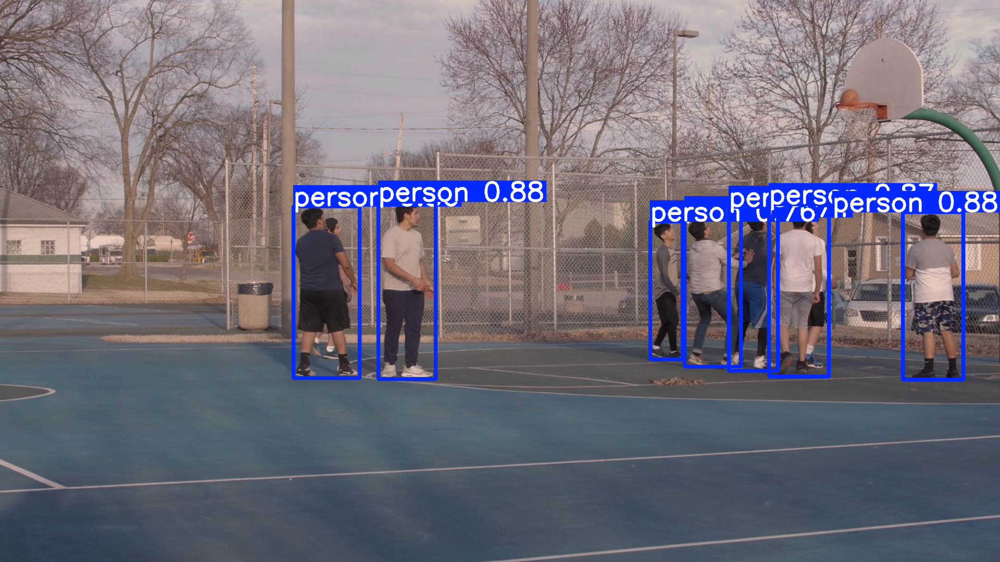


0: 384x640 7 persons, 19.0ms
Speed: 4.3ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


KeyboardInterrupt: 

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO model
model = YOLO("yolo11n.pt")

# path for video / 0 for webcam
source = "video.mp4"
cap = cv2.VideoCapture(source)

# Loop through the video frames
while cap.isOpened():
    success, frame = cap.read()

    if success:
        # Run YOLO inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        break

cap.release()

### Task

Running real-time video (especially with cv2.imshow) in Jupyter Notebooks introduces latency and may crash or be slow due to limited GUI support. It's strongly recommended to use .py scripts for smooth real-time performance.

Run the .py script for better performance.

### Inference Arguments

`model.predict()` accepts multiple arguments that can be passed at inference time to override defaults:

| Argument         | Type           | Default             | Description |
|------------------|----------------|----------------------|-------------|
| **`source`**     | `str`          | `'ultralytics/assets'` | Specifies the data source for inference. Can be an image path, video file, directory, URL, or device ID (e.g. `0`) for webcam/live feeds. |
| **`conf`**       | `float`        | `0.25`              | Minimum confidence threshold. Detections below this are ignored. |
| **`iou`**        | `float`        | `0.7`               | IoU threshold for Non-Maximum Suppression (NMS). Lower = fewer overlapping boxes. |
| **`verbose`**    | `bool`         | `True`              | Show detailed logs during inference. Set to `False` for silent mode. |

### Task

Suppress incorrect detection results where the model mistakenly identifies basketball backboard as a frisbee in the previous example.

In [ ]:
# Answer Here!

import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO model
model = YOLO("yolo11n.pt")

# path for video / 0 for webcam
source = "video.mp4"
cap = cv2.VideoCapture(source)

# Loop through the video frames
while cap.isOpened():
    success, frame = cap.read()

    if success:
        # Run YOLO inference on the frame
        results = model.predict(frame, conf=0.7)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        break

cap.release()

# 2. Instance Segmentation

![banner](https://github.com/ultralytics/docs/releases/download/0/instance-segmentation-examples.avif)

Instance segmentation goes a step further than object detection and involves identifying individual objects in an image and segmenting them from the rest of the image.

The output of an instance segmentation model is a set of masks or contours that outline each object in the image, along with class labels and confidence scores for each object. Instance segmentation is useful when you need to know not only where objects are in an image, but also what their exact shape is.

## 2.1 Inference


0: 640x480 4 persons, 1 bus, 1 stop sign, 85.8ms
Speed: 4.7ms preprocess, 85.8ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 480)


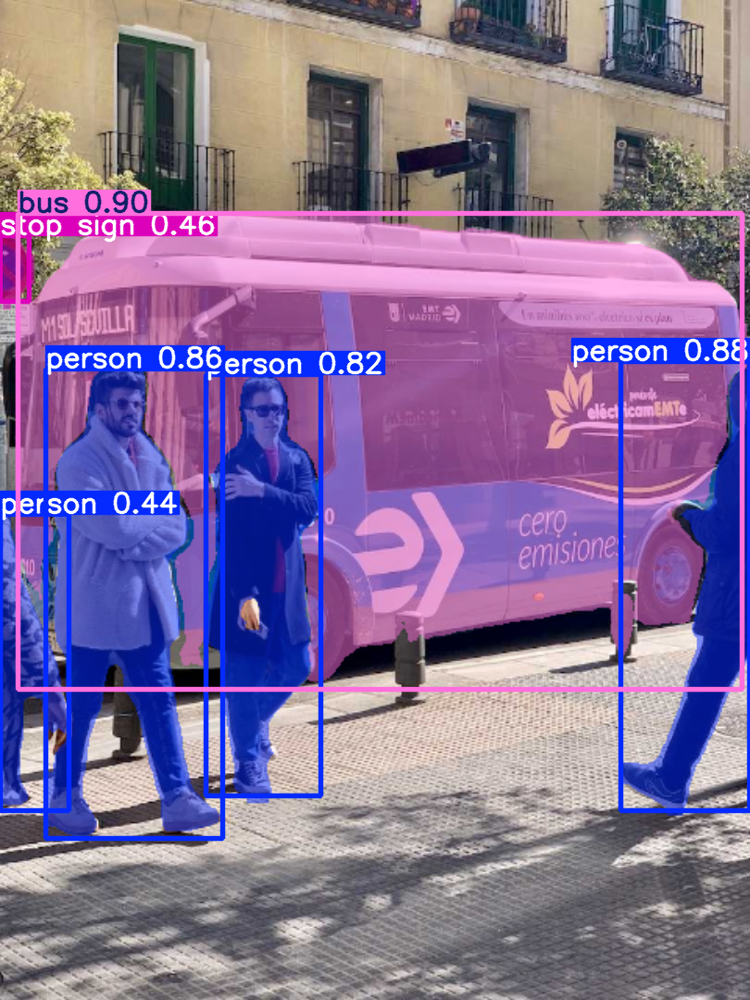

In [ ]:
from ultralytics import YOLO
from PIL import Image
import IPython.display as display

# Load a pretrained YOLO11n model
model = YOLO("yolo11n-seg.pt")

# Run inference on 'bus.jpg'
results = model(["https://ultralytics.com/images/bus.jpg"])

# Process results list
for result in results:
    # Plot results image
    im_bgr = result.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # Convert BGR to RGB for PIL

    # Display results inline
    display.display(im_rgb)

    # Save results to disk
    result.save(filename="result.jpg")

#### Masks

Masks object can be used index, manipulate and convert masks to segments.

Here's the organized **Markdown table** for the `masks` object properties and methods:

| **Name** | **Type**         | **Description** |
|----------|------------------|-----------------|
| **`xyn`**     | Property (`torch.Tensor`) | A list of **normalized segments** (coordinates between 0 and 1), each as a tensor. |
| **`xy`**      | Property (`torch.Tensor`) | A list of **pixel-coordinate segments** (absolute values), each as a tensor. |

In [ ]:
print("Number of instances: ", len(results[0].masks.xy), "\n")
print("Segments:\n ", results[0].masks.xy[0], "\n")

Number of instances:  6 

Segments:
  [[     185.62      232.88]
 [     185.62      237.94]
 [     183.94      239.62]
 ...
 [     410.06      239.62]
 [     408.38      237.94]
 [     408.38      232.88]] 



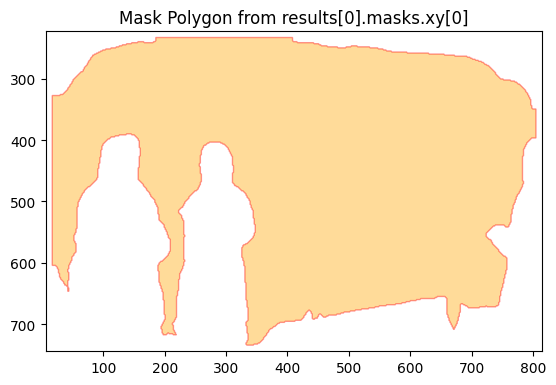

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# Get the first list of xy points from the mask
points = results[0].masks.xy[0]  # shape: (N, 2), where N is number of points

# Create a plot
fig, ax = plt.subplots()
polygon = Polygon(points, closed=True, edgecolor='red', facecolor='orange', alpha=0.4)
ax.add_patch(polygon)

# Set limits based on the points
ax.set_xlim(points[:, 0].min() - 10, points[:, 0].max() + 10)
ax.set_ylim(points[:, 1].min() - 10, points[:, 1].max() + 10)
ax.invert_yaxis()  # Invert y-axis to match image coordinates
ax.set_aspect('equal')
plt.title("Mask Polygon from results[0].masks.xy[0]")
plt.show()

Even when you're working with **segmentation masks**, you can **still access bounding boxes** just like before via the `boxes` attribute in the `results` object.

```python
boxes = results[0].boxes
```

### Task

Try it on a real time video.

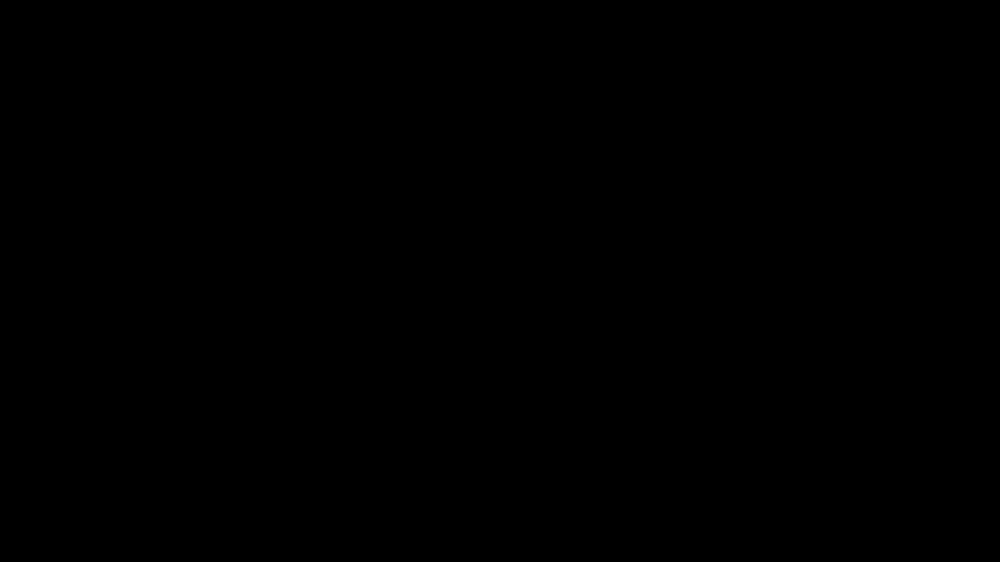

In [ ]:
# Answer Here!
import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO model
model = YOLO("yolo11n-seg.pt")

# path for video / 0 for webcam
source = "video.mp4"
cap = cv2.VideoCapture(source)

# Loop through the video frames
while cap.isOpened():
    success, frame = cap.read()

    if success:
        # Run YOLO inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        break

cap.release()

# 3. Object Tracking

![banner](https://github.com/ultralytics/docs/releases/download/0/multi-object-tracking-examples.avif)

Object tracking in the realm of video analytics is a critical task that not only identifies the location and class of objects within the frame but also maintains a unique ID for each detected object as the video progresses. The applications are limitless—ranging from surveillance and security to real-time sports analytics.

tracking is available for all `Detect`, `Segment` and `Pose` models run on videos or streaming sources.

## 3.1 Inference

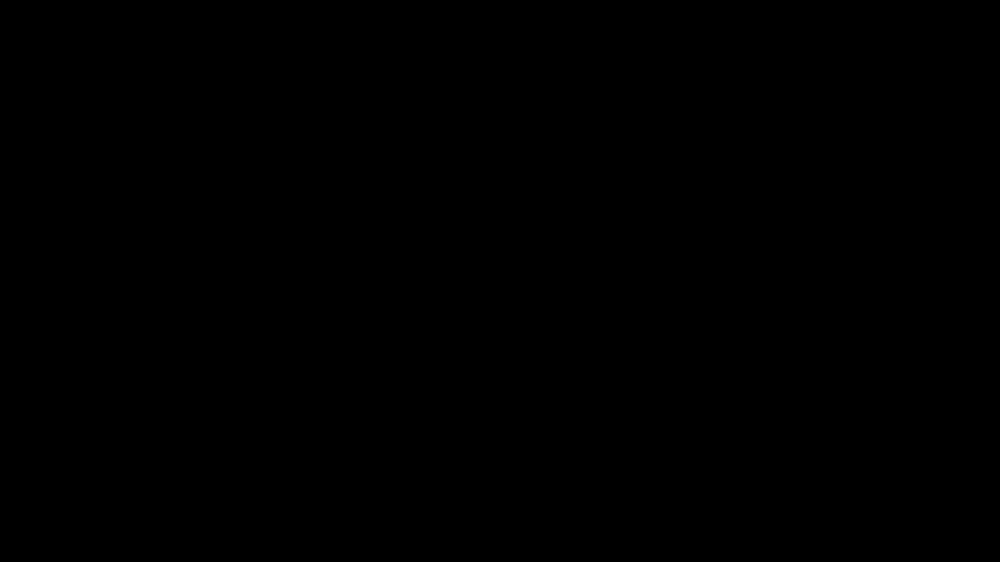

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO11 model
model = YOLO("yolo11n.pt")

# Open the video file
video_path = "video.mp4"
cap = cv2.VideoCapture(video_path)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLO11 tracking on the frame, persisting tracks between frames
        results = model.track(frame, persist=True)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

### Plotting Tracks Over Time

Visualizing object tracks over consecutive frames can provide valuable insights into the movement patterns and behavior of detected objects within a video.

### Task

Discuss how to design and implement a system that visually tracks objects across video frames using bounding boxes and ids.

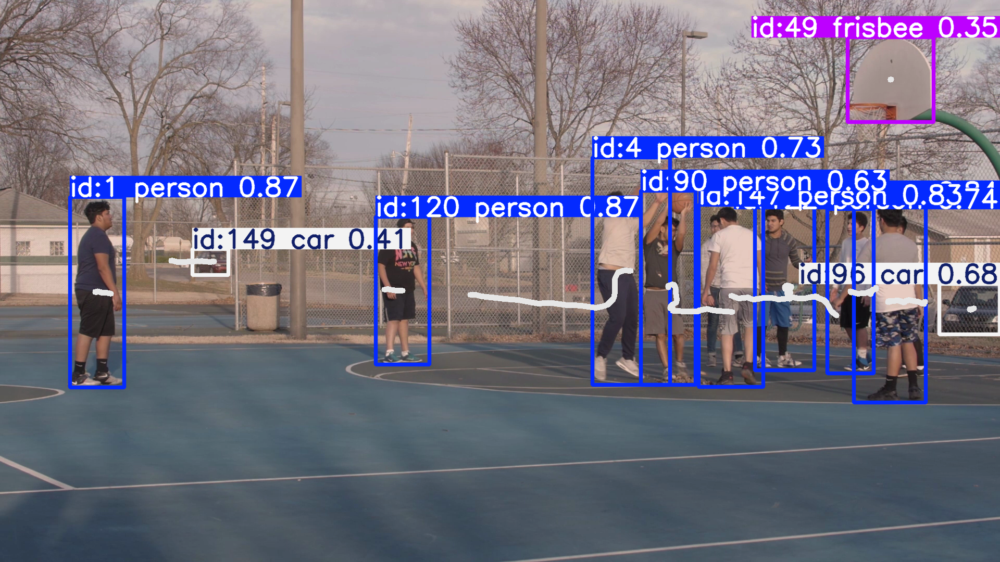


0: 384x640 (no detections), 106.4ms
Speed: 2.2ms preprocess, 106.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


AttributeError: 'NoneType' object has no attribute 'int'

In [ ]:
from collections import defaultdict
import cv2
import numpy as np
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO11 model
model = YOLO("yolo11n.pt")

# Open the video file
video_path = "video.mp4"
cap = cv2.VideoCapture(video_path)

# Store the track history
track_history = defaultdict(lambda: [])

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLO11 tracking on the frame, persisting tracks between frames
        results = model.track(frame, persist=True)

        # Get the boxes and track IDs
        boxes = results[0].boxes.xywh.cpu()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Plot the tracks
        for box, track_id in zip(boxes, track_ids):
            x, y, w, h = box
            track = track_history[track_id]
            track.append((float(x), float(y)))  # x, y center point
            if len(track) > 30:  # retain 30 tracks for 30 frames
                track.pop(0)

            # Draw the tracking lines
            points = np.hstack(track).astype(np.int32).reshape((-1, 1, 2))
            cv2.polylines(annotated_frame, [points], isClosed=False, color=(230, 230, 230), thickness=10)

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

# 4. Pose Estimation

![banner](https://github.com/ultralytics/docs/releases/download/0/pose-estimation-examples.avif)

Pose estimation is a task that involves identifying the location of specific points in an image, usually referred to as keypoints. The keypoints can represent various parts of the object such as joints, landmarks, or other distinctive features.

## 4.1 Inference

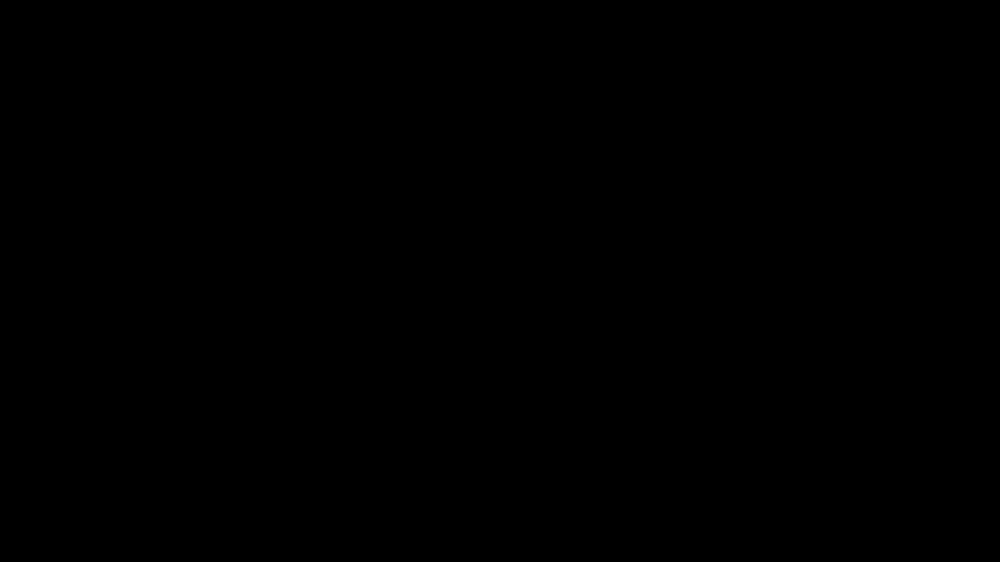

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
from PIL import Image

# Load the YOLO11 model
model = YOLO("yolo11n-pose.pt")

# Open the video file
video_path = "video.mp4"
cap = cv2.VideoCapture(video_path)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLO11 tracking on the frame, persisting tracks between frames
        results = model.predict(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Convert BGR to RGB
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

        # Display the frame inline
        clear_output(wait=True)
        display(Image.fromarray(rgb_frame))

    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

#### Keypoints

Keypoints object can be used index, manipulate and normalize coordinates.

| **Name**   | **Type**              | **Description** |
|------------|-----------------------|-----------------|
| `xyn`      | Property (`torch.Tensor`) | A list of normalized keypoints represented as tensors. |
| `xy`       | Property (`torch.Tensor`) | A list of keypoints in pixel coordinates represented as tensors. |
| `conf`     | Property (`torch.Tensor`) | Returns confidence values of keypoints if available, else `None`. |

| #  | Joint          | #  | Joint         |
|----|----------------|----|---------------|
| 1  | Nose           | 2  | Left Eye      |
| 3  | Right Eye      | 4  | Left Ear      |
| 5  | Right Ear      | 6  | Left Shoulder |
| 7  | Right Shoulder | 8  | Left Elbow    |
| 9  | Right Elbow    | 10 | Left Wrist    |
| 11 | Right Wrist    | 12 | Left Hip      |
| 13 | Right Hip      | 14 | Left Knee     |
| 15 | Right Knee     | 16 | Left Ankle    |
| 17 | Right Ankle    |    |               |

In [ ]:
print(results[0].keypoints)

ultralytics.engine.results.Keypoints object with attributes:

conf: None
data: tensor([], size=(1, 0, 51))
has_visible: False
orig_shape: (1080, 1920)
shape: torch.Size([1, 0, 51])
xy: tensor([], size=(1, 0, 2))
xyn: tensor([], size=(1, 0, 2))


# Appendix

YOLO11 can train, val, predict and export models for the most common tasks in vision AI: [Detect](https://docs.ultralytics.com/tasks/detect/), [Segment](https://docs.ultralytics.com/tasks/segment/), [Classify](https://docs.ultralytics.com/tasks/classify/) and [Pose](https://docs.ultralytics.com/tasks/pose/). See [YOLO11 Tasks Docs](https://docs.ultralytics.com/tasks/) for more information.

<br><img width="1024" src="https://raw.githubusercontent.com/ultralytics/assets/main/im/banner-tasks.png">
